In [2]:
from google.colab import drive, files, data_table
MOUNT_PATH = "/content/gdrive"
drive.mount(MOUNT_PATH)

Mounted at /content/gdrive


In [3]:
!pip install monai==1.2.0 nibabel tqdm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 25.9 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-many

In [4]:
import os
os.system("pip install monai==1.2.0 nibabel tqdm")

0

In [5]:
# BRATS veri setinin Drive'daki yolunu belirt
brats_zip_path = '/content/gdrive/MyDrive/brats/archive.zip'

# Çıkartılacağı hedef klasörü belirt
extract_to_path = '/content/BraTS2020/Datasets'

# zip dosyasını çıkart
import zipfile
with zipfile.ZipFile(brats_zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to_path)

In [6]:
!pip install tensorflow
!pip install keras
!pip install pillow

In [7]:
import os
import sys
import glob
import random
import warnings
warnings.filterwarnings("ignore", category = FutureWarning)
import numpy as np
import pandas as pd
import nibabel as nib
import matplotlib as mpl
import matplotlib.pyplot as plt
plt.style.use("ggplot")
mpl.rcParams["figure.dpi"] = 300
import missingno as msno
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from PIL import Image, ImageEnhance
import torch
from torch.utils.tensorboard import SummaryWriter
import monai
from monai.data import (Dataset,
                        DataLoader)
from monai.transforms import *
from monai.visualize import (add_animated_gif,
                             plot_2d_or_3d_image)
from monai.utils import set_determinism

import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Input, Conv3D, MaxPool3D, AvgPool3D
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import *

In [8]:
PROJECT_ROOT = "/content/BraTS2020"
DATASET_PATH = os.path.join(PROJECT_ROOT, "Datasets")
TENSORBOARD_VIZ_PATH = os.path.join(PROJECT_ROOT, "Visualizations")
MODEL_CHECKPOINT_PATH = os.path.join(PROJECT_ROOT, "Model-Checkpoints")
SHOW_TENSORBOARD = False # Boolean created to toggle the display of tensorboard
VIEW_DATA_TABLE = False # Boolean created to toggle the display of DataTable version of DataFrames

BRATS_2020_TRAINING_DATA_PATH = os.path.join(DATASET_PATH, "BraTS2020_TrainingData", "MICCAI_BraTS2020_TrainingData")
BRATS_2020_VALIDATION_DATA_PATH = os.path.join(DATASET_PATH, "BraTS2020_ValidationData", "MICCAI_BraTS2020_ValidationData")

training_name_mapping_csv_path = os.path.join(BRATS_2020_TRAINING_DATA_PATH, "name_mapping.csv")
training_survival_csv_path = os.path.join(BRATS_2020_TRAINING_DATA_PATH, "survival_info.csv")

validation_name_mapping_csv_path = os.path.join(BRATS_2020_VALIDATION_DATA_PATH, "name_mapping_validation_data.csv")
validation_survival_csv_path = os.path.join(BRATS_2020_VALIDATION_DATA_PATH, "survival_evaluation.csv")

In [9]:
RANDOM_SEED_VALUE = 42
random.seed(RANDOM_SEED_VALUE)
set_determinism(seed = RANDOM_SEED_VALUE)

In [10]:
TOTAL_BRAIN_MRI_REPRESENTATION = 4
TOTAL_SEGMENTATION_MAPS = 3

device = "cuda" if torch.cuda.is_available() else "cpu"

In [11]:
hgg_colors = ["White", "Purple", "Yellow", "Green"]
hgg_cmap = mpl.colors.ListedColormap(hgg_colors)
hgg_norm = mpl.colors.BoundaryNorm([0, 0.9, 1.9, 3.9, 4.9], hgg_cmap.N)

lgg_colors = ["White", "Purple", "Yellow"]
lgg_cmap = mpl.colors.ListedColormap(lgg_colors)
lgg_norm = mpl.colors.BoundaryNorm([0, 0.9, 1.9, 2.9], lgg_cmap.N)

In [12]:
training_mapping_df = pd.read_csv(training_name_mapping_csv_path)
validation_mapping_df = pd.read_csv(validation_name_mapping_csv_path)

In [13]:
training_mapping_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 369 entries, 0 to 368
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   Grade                  369 non-null    object
 1   BraTS_2017_subject_ID  285 non-null    object
 2   BraTS_2018_subject_ID  285 non-null    object
 3   TCGA_TCIA_subject_ID   167 non-null    object
 4   BraTS_2019_subject_ID  335 non-null    object
 5   BraTS_2020_subject_ID  369 non-null    object
dtypes: object(6)
memory usage: 17.4+ KB


In [14]:
training_mapping_df.head()

,Grade,BraTS_2017_subject_ID,BraTS_2018_subject_ID,TCGA_TCIA_subject_ID,BraTS_2019_subject_ID,BraTS_2020_subject_ID
0,HGG,Brats17_CBICA_AAB_1,Brats18_CBICA_AAB_1,NaN,BraTS19_CBICA_AAB_1,BraTS20_Training_001
1,HGG,Brats17_CBICA_AAG_1,Brats18_CBICA_AAG_1,NaN,BraTS19_CBICA_AAG_1,BraTS20_Training_002
2,HGG,Brats17_CBICA_AAL_1,Brats18_CBICA_AAL_1,NaN,BraTS19_CBICA_AAL_1,BraTS20_Training_003
3,HGG,Brats17_CBICA_AAP_1,Brats18_CBICA_AAP_1,NaN,BraTS19_CBICA_AAP_1,BraTS20_Training_004
4,HGG,Brats17_CBICA_ABB_1,Brats18_CBICA_ABB_1,NaN,BraTS19_CBICA_ABB_1,BraTS20_Training_005


In [15]:
glioma_type_count = training_mapping_df["Grade"].value_counts()[: :-1]
glioma_type_count

Grade
LGG     76
HGG    293
Name: count, dtype: int64

In [16]:
validation_mapping_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125 entries, 0 to 124
Data columns (total 5 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   BraTS_2017_subject_ID  101 non-null    object
 1   BraTS_2018_subject_ID  118 non-null    object
 2   TCGA_TCIA_subject_ID   76 non-null     object
 3   BraTS_2019_subject_ID  125 non-null    object
 4   BraTS_2020_subject_ID  125 non-null    object
dtypes: object(5)
memory usage: 5.0+ KB


In [17]:
validation_mapping_df.head()

,BraTS_2017_subject_ID,BraTS_2018_subject_ID,TCGA_TCIA_subject_ID,BraTS_2019_subject_ID,BraTS_2020_subject_ID
0,Brats17_CBICA_AAM_1,Brats18_CBICA_AAM_1,NaN,BraTS19_CBICA_AAM_1,BraTS20_Validation_001
1,Brats17_CBICA_ABT_1,Brats18_CBICA_ABT_1,NaN,BraTS19_CBICA_ABT_1,BraTS20_Validation_002
2,Brats17_CBICA_ALA_1,Brats18_CBICA_ALA_1,NaN,BraTS19_CBICA_ALA_1,BraTS20_Validation_003
3,Brats17_CBICA_ALT_1,Brats18_CBICA_ALT_1,NaN,BraTS19_CBICA_ALT_1,BraTS20_Validation_004
4,Brats17_CBICA_ALV_1,Brats18_CBICA_ALV_1,NaN,BraTS19_CBICA_ALV_1,BraTS20_Validation_005


In [18]:
training_data_df = pd.DataFrame()

for curr_id, curr_grade in training_mapping_df[["BraTS_2020_subject_ID", "Grade"]].itertuples(index=False):
    absolute_path = os.path.join(BRATS_2020_TRAINING_DATA_PATH, curr_id)
    for curr_path, _, filenames in os.walk(absolute_path):
        temp_df = pd.DataFrame([(curr_id, os.path.join(curr_path, curr_file), curr_grade) for curr_file in filenames], columns=["brats_2020_id", "image_path", "tumor_class"])
        training_data_df = pd.concat([training_data_df, temp_df], ignore_index=True)


training_data_df.columns = ["brats_2020_id", "image_path", "tumor_class"]

In [19]:
training_data_seg_masks_df = training_data_df.loc[training_data_df.image_path.str.contains("seg.nii")]
training_data_df = training_data_df.drop(training_data_seg_masks_df.index).reset_index(drop=True)
training_data_seg_masks_df.reset_index(drop=True, inplace=True)

In [20]:
training_data_df.head()

,brats_2020_id,image_path,tumor_class
0,BraTS20_Training_001,/content/BraTS2020/Datasets/BraTS2020_Training...,HGG
1,BraTS20_Training_001,/content/BraTS2020/Datasets/BraTS2020_Training...,HGG
2,BraTS20_Training_001,/content/BraTS2020/Datasets/BraTS2020_Training...,HGG
3,BraTS20_Training_001,/content/BraTS2020/Datasets/BraTS2020_Training...,HGG
4,BraTS20_Training_002,/content/BraTS2020/Datasets/BraTS2020_Training...,HGG


In [21]:
training_data_seg_masks_df.head()

,brats_2020_id,image_path,tumor_class
0,BraTS20_Training_001,/content/BraTS2020/Datasets/BraTS2020_Training...,HGG
1,BraTS20_Training_002,/content/BraTS2020/Datasets/BraTS2020_Training...,HGG
2,BraTS20_Training_003,/content/BraTS2020/Datasets/BraTS2020_Training...,HGG
3,BraTS20_Training_004,/content/BraTS2020/Datasets/BraTS2020_Training...,HGG
4,BraTS20_Training_005,/content/BraTS2020/Datasets/BraTS2020_Training...,HGG


In [22]:
print(f"""Total Observation In Training Dataset: {training_data_df.shape[0]}.
Total Observations In Training Data Segmentation Masks: {training_data_seg_masks_df.shape[0]}.""")

Total Observation In Training Dataset: 1477.
Total Observations In Training Data Segmentation Masks: 368.


In [23]:
example_hgg_mri_image_path = training_data_df.image_path[0]
example_hgg_mri_image_seg_mask_path = training_data_seg_masks_df.image_path[0]

example_lgg_mri_image_path = training_data_df.image_path[1040]
example_lgg_mri_image_seg_mask_path = training_data_seg_masks_df.image_path[261]

example_hgg_mri_image = nib.load(example_hgg_mri_image_path).get_fdata()
example_hgg_mri_seg_mask_image = nib.load(example_hgg_mri_image_seg_mask_path).get_fdata()

example_lgg_mri_image = nib.load(example_lgg_mri_image_path).get_fdata()
example_lgg_mri_seg_mask_image = nib.load(example_lgg_mri_image_seg_mask_path).get_fdata()

In [24]:
print("Information About High Grade Glioma (HGG) Cases Data:")
print(f"\tDimension of Structural Brain MRI Sequence (T1, T1-Gd, T2, T2-FLAIR): {example_hgg_mri_image.shape}")
print(f"\tDimension of Structural Brain MRI Segmentation Map: {example_hgg_mri_seg_mask_image.shape}", end = "\n\n")

Information About High Grade Glioma (HGG) Cases Data:
	Dimension of Structural Brain MRI Sequence (T1, T1-Gd, T2, T2-FLAIR): (240, 240, 155)
	Dimension of Structural Brain MRI Segmentation Map: (240, 240, 155)



In [25]:
print("Information About Low Grade Glioma (LGG) Cases Data:")
print(f"\tDimension of Structural Brain MRI Sequence (T1, T1-Gd, T2, T2-FLAIR): {example_lgg_mri_image.shape}")
print(f"\tDimension of Structural Brain MRI Segmentation Map: {example_lgg_mri_seg_mask_image.shape}")

Information About Low Grade Glioma (LGG) Cases Data:
	Dimension of Structural Brain MRI Sequence (T1, T1-Gd, T2, T2-FLAIR): (240, 240, 155)
	Dimension of Structural Brain MRI Segmentation Map: (240, 240, 155)


In [26]:
def visualize_brain_mri_representations(mri_representation_paths: pd.Series, slice_index: int, glioma_grade: str) -> None:
    assert slice_index >= 0 and slice_index <= 155
    subplot_titles = [os.path.splitext(os.path.splitext(os.path.split(curr_path)[-1])[0])[0].split("_")[-1].strip().upper() for curr_path in mri_representation_paths]
    fig, axes = plt.subplots(ncols=4, figsize=(20, 5))
    fig.suptitle("Brain MRI Representations (BraTS-2020)", fontdict=dict(size=14))

    load_transform = Compose([
        LoadImaged(keys="image"),
        EnsureChannelFirstd(keys="image"),
        CropForegroundd(keys="image", source_key="image")
    ])

    for curr_axis, curr_title, curr_path in zip(axes, subplot_titles, mri_representation_paths):
        image_dict = load_transform({"image": curr_path})
        curr_representation = image_dict["image"][0, slice_index]
        curr_axis.imshow(curr_representation, cmap="gray", interpolation="lanczos")
        curr_axis.set_title(curr_title, fontdict=dict(size=12))


In [27]:
def visualise_brain_mri_seg(path_to_image: str, path_to_seg_mask: str, slice_index: int, glioma_grade: str) -> None:
    assert slice_index >= 0 and slice_index <= 155
    img_cmap, img_norm = (hgg_cmap, hgg_norm) if "HGG" in glioma_grade else (lgg_cmap, lgg_norm)
    fig, axes = plt.subplots(ncols = 3, figsize = (15, 7))
    fig.suptitle(f"Brain MRI Sequence & Segmentation Mask Visualization of {glioma_grade}", fontdict = dict(size = 16))

    brain_mri_slice = (nib.load(path_to_image).get_fdata().astype(np.float32) / 255.0).T[slice_index]
    axes[1].imshow(brain_mri_slice, cmap = "gray", interpolation = "nearest")
    axes[1].set_title("Beyin MRI Dizisinin Görüntüsü", fontdict = dict(size = 12))

    brain_mri_seg_slice = (nib.load(path_to_seg_mask).get_fdata().astype(np.int8)).T[slice_index]
    axes[2].imshow(brain_mri_seg_slice, cmap = img_cmap, norm = img_norm, interpolation = "bilinear")
    axes[2].set_title("Farklı Segmentasyon Maskeleri", fontdict = dict(size = 12))
    axes[0].set_title("Segmentasyon Maskeli Beyin MRI Görüntüsü", fontdict = dict(size = 12))
    axes[0].imshow(brain_mri_slice, cmap = "gray", interpolation = "nearest")

    brain_mri_seg_slice = brain_mri_seg_slice.astype(np.float32)
    brain_mri_seg_slice[brain_mri_seg_slice == 0.0] = np.nan
    axes[0].imshow(brain_mri_seg_slice, cmap = img_cmap, norm = img_norm, interpolation = "bilinear", alpha = 0.7)
    axes[0].axis("off")
    sns.despine()
    fig.tight_layout()

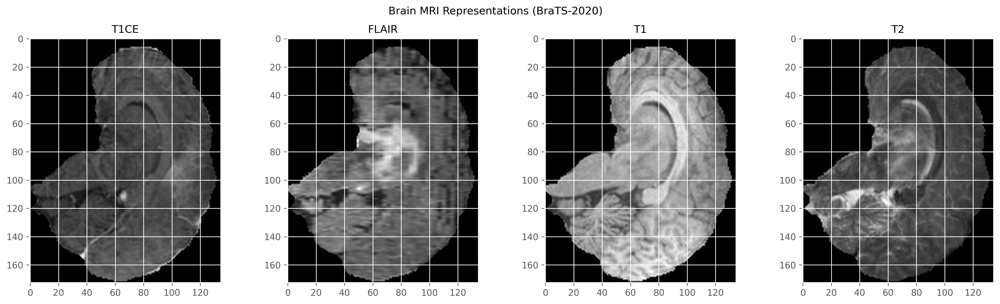

In [28]:
visualize_brain_mri_representations(training_data_df.image_path[:4], 73, "HGG")

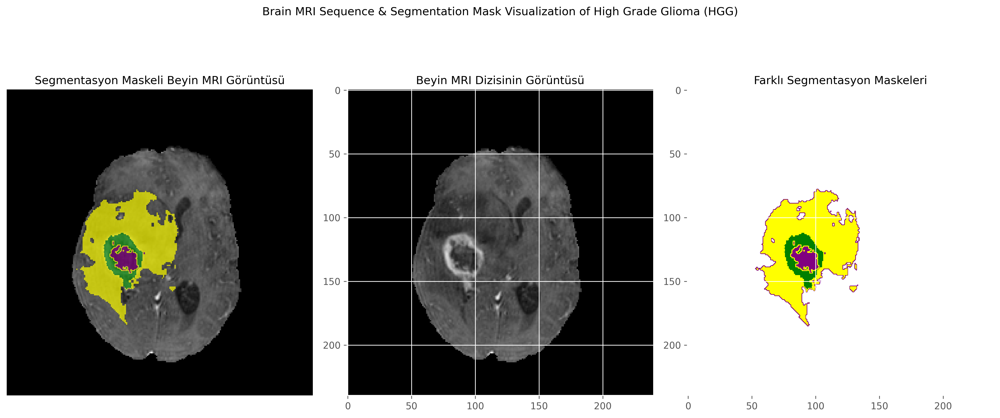

In [29]:
visualise_brain_mri_seg(example_hgg_mri_image_path, example_hgg_mri_image_seg_mask_path, 73, "High Grade Glioma (HGG)")

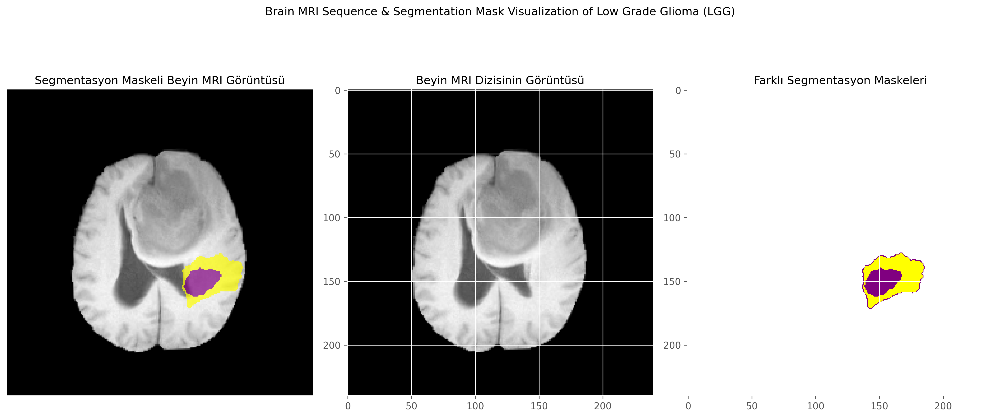

In [30]:
visualise_brain_mri_seg(example_lgg_mri_image_path, example_lgg_mri_image_seg_mask_path, 90, "Low Grade Glioma (LGG)")

In [31]:
training_data_dicts = [] # Creating training data dictionary for Data Augmentation Pipeline
training_data_groupby = training_data_df.groupby(by = ["brats_2020_id"])
unique_patient_id = training_data_df.brats_2020_id.unique()
for curr_grp_id, curr_seg_mask_path in zip(unique_patient_id, training_data_seg_masks_df.image_path):
    curr_data_dict = dict(image = [], seg_mask = curr_seg_mask_path)
    curr_data_dict["image"].extend(training_data_groupby.get_group(curr_grp_id).image_path)
    training_data_dicts.append(curr_data_dict)

In [32]:
train_data_files, val_data_files = train_test_split(training_data_dicts,
                                                    train_size = 0.80,
                                                    random_state = RANDOM_SEED_VALUE)

In [34]:
testing_data_dicts = []
for curr_patient_id in validation_mapping_df["BraTS_2020_subject_ID"].str.strip():
    curr_dict = dict(image = [])
    curr_folder_path = os.path.join(BRATS_2020_VALIDATION_DATA_PATH, curr_patient_id)
    curr_dict["image"].extend([os.path.join(curr_folder_path, curr_filepath) for curr_filepath in os.listdir(curr_folder_path)])
    testing_data_dicts.append(curr_dict)

In [35]:
print(f"Total observations in training dataset: {len(train_data_files)}")
print(f"Total observations in validation dataset: {len(val_data_files)}")
print(f"Total observations in testing dataset: {len(testing_data_dicts)}")

Total observations in training dataset: 294
Total observations in validation dataset: 74
Total observations in testing dataset: 125


In [36]:
np.unique(example_hgg_mri_seg_mask_image)

array([0., 1., 2., 4.])

In [37]:
seg_mask_id = dict(NER_NET = 1, ED = 2, ET = 4)
tumor_label_id = dict(WT = 0, TC = 1, ET = 2)

In [38]:
def extract_tumor_labels_from_seg_masks(image):
    is_tensor = True if isinstance(image, torch.Tensor) else False
    if is_tensor:
        image = image.cpu().numpy()
    if image.ndim == 4 and image.shape[0] == 1:
        image = image.squeeze(0)
    whole_tumor, tumor_core, enhancing_tumor = image.copy(), image.copy(), image.copy()
    tumor_core[tumor_core == seg_mask_id["ED"]] = 0
    enhancing_tumor[(enhancing_tumor == seg_mask_id["NER_NET"]) | (enhancing_tumor == seg_mask_id["ED"])] = 0
    seg_masks = np.stack([whole_tumor, tumor_core, enhancing_tumor])
    return torch.from_numpy(seg_masks) if is_tensor else seg_masks

In [39]:
def brain_mri_tumor_labels_viz(path_to_mri_scan: str, path_to_seg_mask: str, tumor_type: str, slice_index: int = 100):
    img_cmap, img_norm = (hgg_cmap, hgg_norm) if "HGG" in tumor_type else (lgg_cmap, lgg_norm)

    # Transformations
    load_transform = LoadImaged(keys=["image", "seg"])
    ensure_channel_first = EnsureChannelFirstd(keys=["image", "seg"])
    orientation = Orientationd(keys=["image", "seg"], axcodes="RAS")

    # Load and process image
    image_dict = load_transform({"image": path_to_mri_scan, "seg": path_to_seg_mask})
    image_dict = ensure_channel_first(image_dict)
    image_dict = orientation(image_dict)

    brain_mri_scan_slice = (image_dict["image"].astype(np.float32) / 255.0).T[slice_index]
    seg_mask = image_dict["seg"].astype(np.int8)

    print(f"Tumor Sub-region labels: {np.unique(seg_mask)}")
    tumor_labels = extract_tumor_labels_from_seg_masks(seg_mask)

    fig, axes = plt.subplots(ncols=4, figsize=(18, 5))
    fig.suptitle(f"Brain MRI Scan + Segmentation Labels {tumor_type}", fontdict=dict(size=14), y=1.03)

    axes[0].imshow(brain_mri_scan_slice, cmap="gray", interpolation="nearest")
    axes[0].set_title("Beyin MRI Taraması", fontdict=dict(size=12))
    axes[1].imshow(tumor_labels[0, :, :, slice_index].T, cmap=img_cmap, norm=img_norm, interpolation="nearest")
    axes[1].set_title("Tüm Tümör (WT)", fontdict=dict(size=12))
    axes[2].imshow(tumor_labels[1, :, :, slice_index].T, cmap=img_cmap, norm=img_norm, interpolation="nearest")
    axes[2].set_title("Tümör Çekirdeği (TC)", fontdict=dict(size=12))
    axes[3].imshow(tumor_labels[2, :, :, slice_index].T, cmap=img_cmap, norm=img_norm, interpolation="nearest")
    axes[3].set_title("Gelişen Tümor (ET)", fontdict=dict(size=12))

    fig.tight_layout()
    sns.despine()

Tumor Sub-region labels: [0 1 2 4]


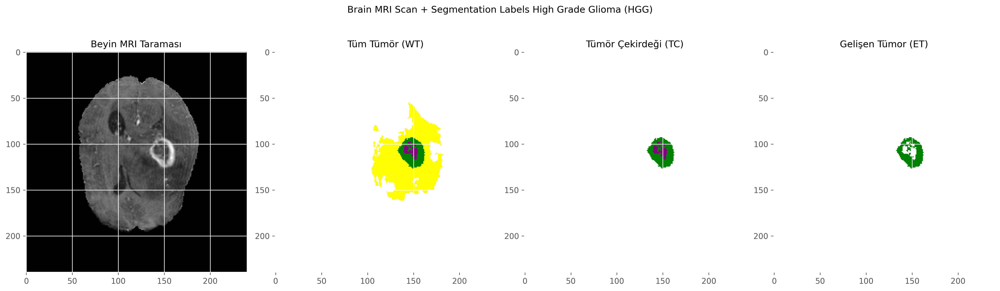

In [40]:
brain_mri_tumor_labels_viz(example_hgg_mri_image_path, example_hgg_mri_image_seg_mask_path, "High Grade Glioma (HGG)", 75)

Tumor Sub-region labels: [0 1 2]


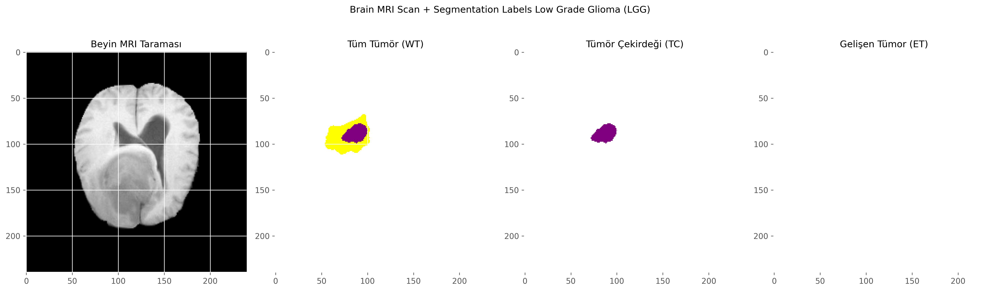

In [41]:
brain_mri_tumor_labels_viz(example_lgg_mri_image_path, example_lgg_mri_image_seg_mask_path, "Low Grade Glioma (LGG)", 90)

In [42]:
train_data_transform_func_list = [LoadImaged(keys = ["image", "seg_mask"]),
                                  EnsureChannelFirstd(keys = ["image"]),
                                  EnsureTyped(keys = "seg_mask",
                                              dtype = np.int8),
                                  Lambdad(keys = "seg_mask",
                                          func = extract_tumor_labels_from_seg_masks),
                                  Spacingd(keys = ["image", "seg_mask"],
                                           pixdim = (1.0, 1.0, 1.0),
                                           mode = ("area", "area")),
                                  Orientationd(keys = ["image", "seg_mask"],
                                               axcodes = "RAS"),
                                  AdjustContrastd(keys = "image", gamma = 1.5),
                                  NormalizeIntensityd(keys = ["image"],
                                                      nonzero = True,
                                                      channel_wise = True),
                                  # HistogramNormalized(keys = "image"),
                                  RandScaleIntensityd(keys = ["image"],
                                                      factors = (0, 10),
                                                      prob = 0.3),
                                  RandStdShiftIntensityd(keys = "image",
                                                         factors = 0.1,
                                                         nonzero = True,
                                                         channel_wise = True,
                                                         prob = 0.7),
                                  RandFlipd(keys = ["image", "seg_mask"],
                                            prob = 0.7,
                                            spatial_axis = (0, 1)),
                                  RandZoomd(keys = ["image", "seg_mask"],
                                            prob = 0.8),
                                  RandGaussianSharpend(keys = "image",
                                                       prob = 0.3),
                                  RandGaussianNoised(keys = "image",
                                                     prob = 0.8,
                                                     mean = 0,
                                                     std = np.random.uniform(0, 0.45)),
                                  RandGibbsNoised(keys = "image",
                                                 prob = 0.5),
                                  EnsureTyped(keys = "image",
                                              device = device,
                                              dtype = np.float32),
                                  EnsureTyped(keys = "seg_mask",
                                              device = device,
                                              dtype = np.int8)
                                ]

In [43]:
training_data = Dataset(data=train_data_files, transform=Compose(train_data_transform_func_list))
training_data_loader = DataLoader(training_data, batch_size=1, shuffle=True, num_workers=2, pin_memory=torch.cuda.is_available())

In [44]:
def brain_mri_img_seg_viz(sample_data: monai.data.Dataset, plot_title: str, tumor_label: int = tumor_label_id["WT"]) -> None:
    glioma_grades = [training_data_seg_masks_df.loc[training_data_seg_masks_df.image_path == curr_data["seg_mask_meta_dict"]["filename_or_obj"].strip(), "tumor_class"].to_list()[0] for curr_data in sample_data]
    fig, axes = plt.subplots(nrows = len(sample_data), ncols = 5, figsize = (25, 10))
    fig.suptitle(plot_title, y = 1.03, fontdict = dict(size = 16))
    for row_idx, curr_train_data in enumerate(sample_data):
        curr_img, curr_seg_img = curr_train_data["image"].cpu().numpy(), curr_train_data["seg_mask"].cpu().numpy().copy().astype(np.float32)
        # curr_seg_img[curr_seg_img == 0.0] = np.nan
        for col_idx in range(5):
            if col_idx != 4:
                axes[row_idx, col_idx].imshow(curr_img[col_idx, :, :, 100], cmap = "gray", interpolation = "antialiased")
                axes[row_idx, col_idx].axis("off")
                axes[row_idx, col_idx].set_title("-".join(os.path.split(curr_train_data["image_meta_dict"]["filename_or_obj"])[-1].split("_")[:-1]), fontdict = dict(size = 12))
                continue
            axes[row_idx, col_idx].imshow(curr_seg_img[tumor_label, :, :, 100],
                                          cmap = hgg_cmap if glioma_grades[row_idx] == "HGG" else lgg_cmap,
                                          norm = hgg_norm if glioma_grades[row_idx] == "HGG" else lgg_norm,
                                          interpolation = "antialiased")
            # axes[row_idx, col_idx].axis("off")
            axes[row_idx, col_idx].set_title(f"Segmentation Mask", fontdict = dict(size = 12))
    sns.despine()
    fig.tight_layout()

In [45]:
print(f"Segmentaion Mask Labels for BraTS20-Training-345: {np.unique(training_data[0]['seg_mask'].cpu().numpy())}")

Segmentaion Mask Labels for BraTS20-Training-345: [0 1 2 3 4]


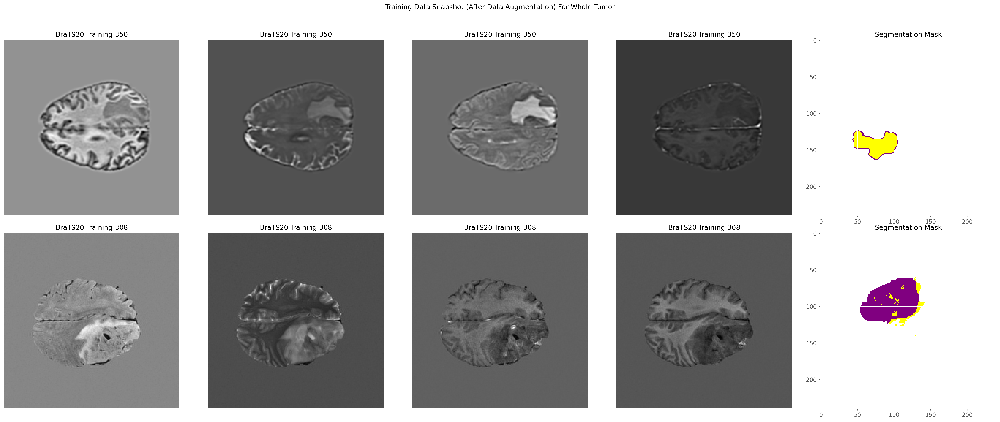

In [47]:
brain_mri_img_seg_viz(training_data[:2],
                      "Training Data Snapshot (After Data Augmentation) For Whole Tumor")

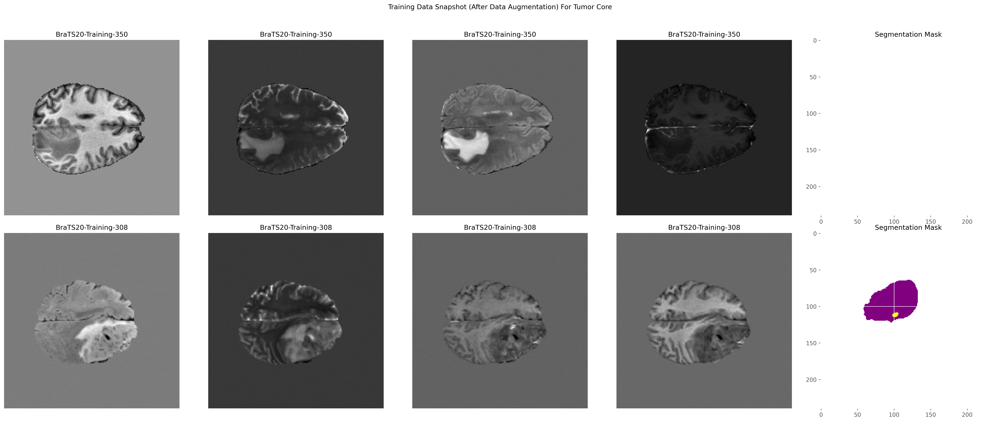

In [48]:
brain_mri_img_seg_viz(training_data[:2],
                      plot_title = "Training Data Snapshot (After Data Augmentation) For Tumor Core",
                      tumor_label = tumor_label_id["TC"])


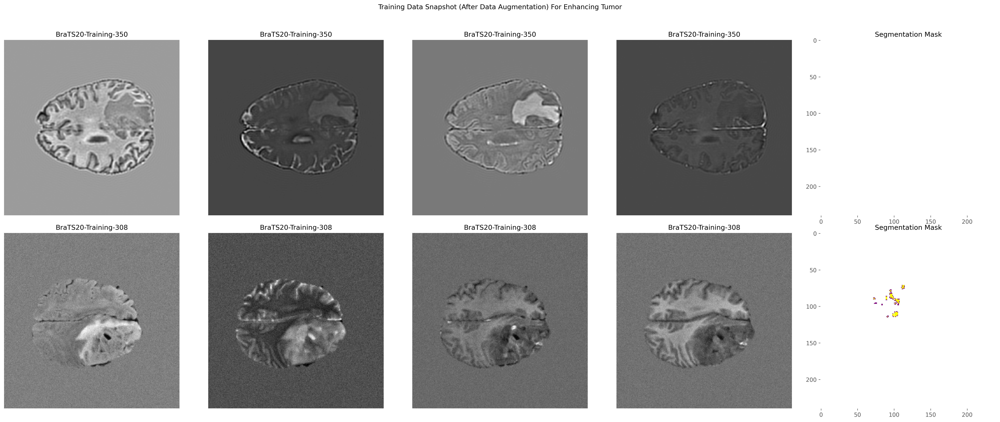

In [49]:
brain_mri_img_seg_viz(training_data[:2],
                      plot_title = "Training Data Snapshot (After Data Augmentation) For Enhancing Tumor",
                      tumor_label = tumor_label_id["ET"])

In [50]:
validation_data_transform_func_list = [LoadImaged(keys = ["image", "seg_mask"]),
                                       EnsureChannelFirstd(keys = "image"),
                                       EnsureTyped(keys = "seg_mask",
                                                   dtype = np.int8),
                                       Lambdad(keys = "seg_mask",
                                               func = extract_tumor_labels_from_seg_masks),
                                       Spacingd(keys = ["image", "seg_mask"],
                                                pixdim = (1.0, 1.0, 1.0),
                                                mode = ("area", "area")),
                                       Orientationd(keys = ["image", "seg_mask"],
                                                    axcodes = "RAS"),
                                       NormalizeIntensityd(keys = ["image"],
                                                           nonzero = True,
                                                           channel_wise = True),
                                       RandStdShiftIntensityd(keys = ["image"],
                                                              nonzero = True,
                                                              channel_wise = True,
                                                              factors = (0, 10),
                                                              prob = 0.5),
                                       RandFlipd(keys = ["image", "seg_mask"],
                                                 spatial_axis = (0, 1),
                                                 prob = 0.5),
                                       RandGaussianNoised(keys = "image",
                                                          mean = 0,
                                                          std = np.random.uniform(0, 0.45),
                                                          prob = 0.8),
                                       EnsureTyped(keys = "image",
                                                   device = device,
                                                   dtype = np.float32),
                                       EnsureTyped(keys = "seg_mask",
                                                   device = device,
                                                   dtype = np.int8)
                                    ]

In [51]:
validation_data = Dataset(val_data_files, transform = Compose(validation_data_transform_func_list))
validation_data_loader = DataLoader(validation_data,
                                    batch_size = 1,
                                    shuffle = True,
                                    num_workers = 2,
                                    pin_memory = torch.cuda.is_available())

In [52]:
print(f"Segmentation Mask Labels for BraTS-Training-120 image: {np.unique(validation_data[7]['seg_mask'].cpu().numpy())}")

Segmentation Mask Labels for BraTS-Training-120 image: [0 1 2 4]


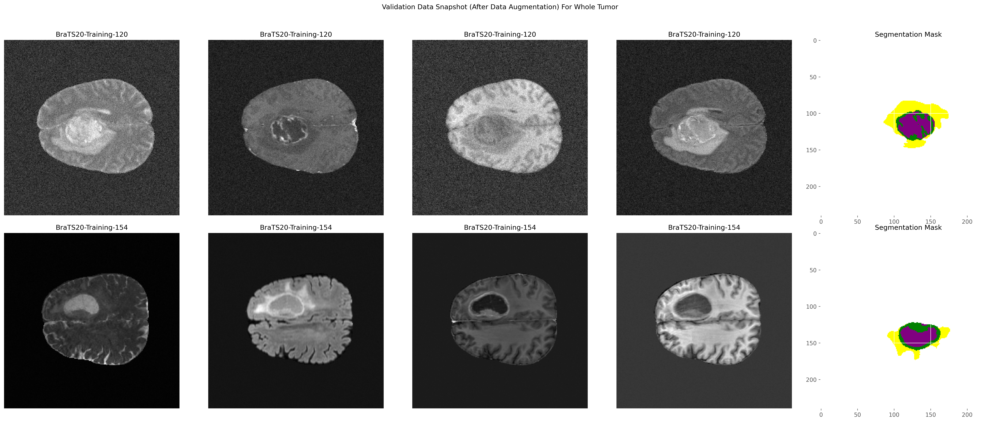

In [53]:
brain_mri_img_seg_viz(validation_data[7:9], plot_title = "Validation Data Snapshot (After Data Augmentation) For Whole Tumor")

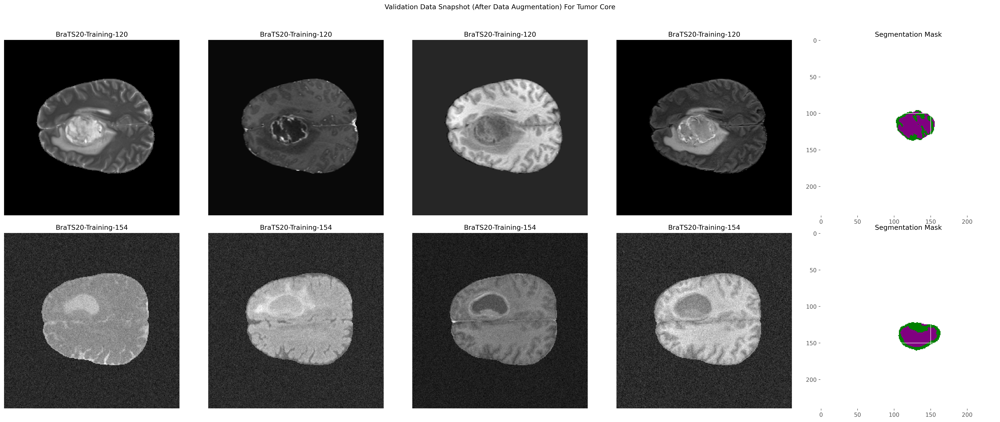

In [54]:
brain_mri_img_seg_viz(validation_data[7:9],
                      plot_title = "Validation Data Snapshot (After Data Augmentation) For Tumor Core",
                      tumor_label = tumor_label_id["TC"])

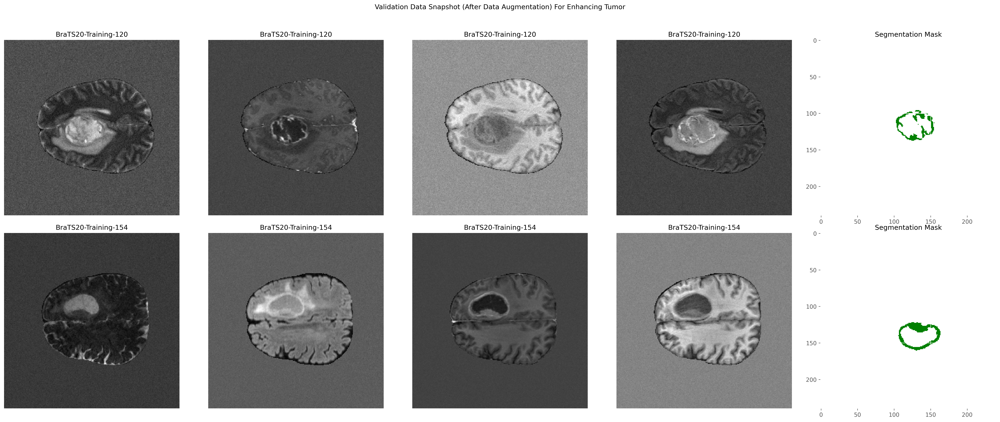

In [55]:
brain_mri_img_seg_viz(validation_data[7:9],
                      plot_title = "Validation Data Snapshot (After Data Augmentation) For Enhancing Tumor",
                      tumor_label = tumor_label_id["ET"])

# Eğitim Modeli

In [ ]:
from monai.networks.nets import BasicUNetPlusPlus
from monai.losses import DiceLoss
from monai.metrics import DiceMetric
from monai.optimizers import Novograd
from sklearn.metrics import precision_score, recall_score, accuracy_score, jaccard_score
from monai.inferers import sliding_window_inference
from monai.data import decollate_batch

In [ ]:
def remove_extra_channel(data):
    if data.shape[0] == 5:
        data = data[:4]
    return data

In [ ]:
train_transform = Compose(
    [
        LoadImaged(keys=["image", "seg_mask"]),
        EnsureChannelFirstd(keys=["image"]),
        Lambdad(keys="image", func=remove_extra_channel),
        EnsureTyped(keys=["image", "seg_mask"]),
        Lambdad(keys = "seg_mask", func = extract_tumor_labels_from_seg_masks),
        Orientationd(keys=["image", "seg_mask"], axcodes="RAS"),
        Spacingd(
            keys=["image", "seg_mask"],
            pixdim=(1.0, 1.0, 1.0),
            mode=("bilinear", "nearest"),
        ),
        RandSpatialCropd(keys=["image", "seg_mask"], roi_size=[224, 224, 144], random_size=False),
        RandFlipd(keys=["image", "seg_mask"], prob=0.5, spatial_axis=0),
        RandFlipd(keys=["image", "seg_mask"], prob=0.5, spatial_axis=1),
        RandFlipd(keys=["image", "seg_mask"], prob=0.5, spatial_axis=2),
        NormalizeIntensityd(keys="image", nonzero=True, channel_wise=True),
        RandScaleIntensityd(keys="image", factors=0.1, prob=1.0),
        RandShiftIntensityd(keys="image", offsets=0.1, prob=1.0),
    ]
)

In [ ]:
val_transform = Compose(
    [
        LoadImaged(keys=["image", "seg_mask"]),
        Lambdad(keys="image", func=remove_extra_channel),
        EnsureChannelFirstd(keys="image"),
        Lambdad(keys = "seg_mask", func = extract_tumor_labels_from_seg_masks),
        EnsureTyped(keys=["image", "seg_mask"]),
        Orientationd(keys=["image", "seg_mask"], axcodes="RAS"),
        Spacingd(
            keys=["image", "seg_mask"],
            pixdim=(1.0, 1.0, 1.0),
            mode=("bilinear", "nearest"),
        ),
        NormalizeIntensityd(keys="image", nonzero=True, channel_wise=True),
    ]
)

In [ ]:
training_data = Dataset(data=train_data_files, transform = Compose(train_transform))
validation_data = Dataset(data=val_data_files, transform = Compose(val_transform))

training_data_loader = DataLoader(training_data, batch_size=1, shuffle=True, num_workers=0, pin_memory=False)
validation_data_loader = DataLoader(validation_data, batch_size=1, shuffle=False, num_workers=0, pin_memory=False)

In [ ]:
max_epochs = 60
val_interval = 1
VAL_AMP = True

In [ ]:
model = BasicUNetPlusPlus(spatial_dims=3, in_channels=4, out_channels=3, features=(32, 32, 64, 128, 256, 32))

# Modeli GPU'ya yükleme
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

BasicUNet features: (32, 32, 64, 128, 256, 32).


BasicUNet(
  (conv_0): TwoConv(
    (conv_0): Convolution(
      (conv): Conv3d(4, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
      (adn): ADN(
        (N): InstanceNorm3d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
        (D): Dropout(p=0.0, inplace=False)
        (A): LeakyReLU(negative_slope=0.1, inplace=True)
      )
    )
    (conv_1): Convolution(
      (conv): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
      (adn): ADN(
        (N): InstanceNorm3d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
        (D): Dropout(p=0.0, inplace=False)
        (A): LeakyReLU(negative_slope=0.1, inplace=True)
      )
    )
  )
  (down_1): Down(
    (max_pooling): MaxPool3d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (convs): TwoConv(
      (conv_0): Convolution(
        (conv): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
        (adn): ADN(
 

In [ ]:
loss_function = DiceLoss(smooth_nr=0, smooth_dr=1e-5, squared_pred=True, to_onehot_y=False, sigmoid=True)
optimizer = torch.optim.Adam(model.parameters(), 1e-4, weight_decay=1e-5)
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=max_epochs)

In [ ]:
dice_metric = DiceMetric(include_background=True, reduction="mean")
dice_metric_batch = DiceMetric(include_background=True, reduction="mean_batch")

post_trans = Compose([Activations(sigmoid=True), AsDiscrete(threshold=0.5)])

In [ ]:
def inference(input):
    def _compute(input):
        return sliding_window_inference(
            inputs=input,
            roi_size=(240, 240, 160),
            sw_batch_size=1,
            predictor=model,
            overlap=0.5,
        )

    if VAL_AMP:
        with torch.cuda.amp.autocast():
            return _compute(input)
    else:
        return _compute(input)

In [ ]:
scaler = torch.cuda.amp.GradScaler()

torch.backends.cudnn.benchmark = True

In [ ]:
import time
best_metric = -1
best_metric_epoch = -1
best_metrics_epochs_and_time = [[], [], []]
epoch_loss_values = []
metric_values = []
metric_values_tc = []
metric_values_wt = []
metric_values_et = []

In [ ]:
for epoch in range(max_epochs):
    epoch_start = time.time()
    print("-" * 10)
    print(f"epoch {epoch + 1}/{max_epochs}")
    model.train()
    epoch_loss = 0
    step = 0
    for batch_data in training_data_loader:
        step_start = time.time()
        step += 1
        inputs, labels = (
            batch_data["image"].to(device),
            batch_data["seg_mask"].to(device),
        )
        optimizer.zero_grad()
        with torch.cuda.amp.autocast():
            outputs = model(inputs)
            outputs = torch.stack(outputs) if isinstance(outputs, list) else outputs
            loss = loss_function(outputs, labels)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        epoch_loss += loss.item()
        print(
            f"{step}/{len(training_data) // training_data_loader.batch_size}"
            f", train_loss: {loss.item():.4f}"
            f", step time: {(time.time() - step_start):.4f}"
        )
    lr_scheduler.step()
    epoch_loss /= step
    epoch_loss_values.append(epoch_loss)
    print(f"epoch {epoch + 1} average loss: {epoch_loss:.4f}")

    if (epoch + 1) % val_interval == 0:
        model.eval()
        with torch.no_grad():
            for val_data in validation_data_loader:
                val_inputs, val_labels = (
                    val_data["image"].to(device),
                    val_data["seg_mask"].to(device),
                )
                val_outputs = inference(val_inputs)
                val_outputs = [post_trans(i) for i in decollate_batch(val_outputs)]
                dice_metric(y_pred=val_outputs, y=val_labels)
                dice_metric_batch(y_pred=val_outputs, y=val_labels)

            metric = dice_metric.aggregate().item()
            metric_values.append(metric)
            metric_batch = dice_metric_batch.aggregate()
            metric_tc = metric_batch[0].item()
            metric_values_tc.append(metric_tc)
            metric_wt = metric_batch[1].item()
            metric_values_wt.append(metric_wt)
            metric_et = metric_batch[2].item()
            metric_values_et.append(metric_et)
            dice_metric.reset()
            dice_metric_batch.reset()

            if metric > best_metric:
                best_metric = metric
                best_metric_epoch = epoch + 1
                best_metrics_epochs_and_time[0].append(best_metric)
                best_metrics_epochs_and_time[1].append(best_metric_epoch)
                best_metrics_epochs_and_time[2].append(time.time() - total_start)
                torch.save(
                    model.state_dict(),
                    os.path.join(PROJECT_ROOT, "best_metric_model.pth"),
                )
                print("saved new best metric model")
            print(
                f"current epoch: {epoch + 1} current mean dice: {metric:.4f}"
                f" tc: {metric_tc:.4f} wt: {metric_wt:.4f} et: {metric_et:.4f}"
                f"\nbest mean dice: {best_metric:.4f}"
                f" at epoch: {best_metric_epoch}"
            )
    print(f"time consuming of epoch {epoch + 1} is: {(time.time() - epoch_start):.4f}")
total_time = time.time() - total_start

Görüntülenen çıkış son 5000 satıra kısaltıldı.
100/294, train_loss: 0.5804, step time: 0.2757
101/294, train_loss: 0.6111, step time: 0.2757
102/294, train_loss: 0.8585, step time: 0.2752
103/294, train_loss: 0.4999, step time: 0.2748
104/294, train_loss: 0.6842, step time: 0.2751
105/294, train_loss: 0.5719, step time: 0.2758
106/294, train_loss: 0.6210, step time: 0.2752
107/294, train_loss: 0.6555, step time: 0.2753
108/294, train_loss: 0.5609, step time: 0.2756
109/294, train_loss: 0.7316, step time: 0.2750
110/294, train_loss: 0.6788, step time: 0.2755
111/294, train_loss: 0.5638, step time: 0.2756
112/294, train_loss: 0.5295, step time: 0.2757
113/294, train_loss: 0.5957, step time: 0.2755
114/294, train_loss: 0.7582, step time: 0.2750
115/294, train_loss: 0.5820, step time: 0.2759
116/294, train_loss: 0.6350, step time: 0.2752
117/294, train_loss: 0.5594, step time: 0.2752
118/294, train_loss: 0.5585, step time: 0.2756
119/294, train_loss: 0.6955, step time: 0.2761
120/294, trai

In [ ]:
print(f"train completed, best_metric: {best_metric:.4f} at epoch: {best_metric_epoch}, total time: {total_time}.")

train completed, best_metric: 0.6277 at epoch: 44, total time: 22877.408675432205.


In [ ]:
from sklearn.metrics import precision_score, recall_score, accuracy_score, jaccard_score
import numpy as np

y_true = np.concatenate([i.cpu().numpy().ravel() for i in val_labels])
y_pred = np.concatenate([i.cpu().numpy().ravel() for i in val_outputs])

precision = precision_score(y_true, y_pred, average='macro')
recall = recall_score(y_true, y_pred, average='macro')
accuracy = accuracy_score(y_true, y_pred)
jaccard = jaccard_score(y_true, y_pred, average='macro')


print(f"Precision: {precision:.4f}")
print(f"Recall (Sensitivity): {recall:.4f}")
print(f"Accuracy: {accuracy:.4f}")
print(f"Jaccard index (IoU): {jaccard:.4f}")


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Precision: 0.3321
Recall (Sensitivity): 0.3303
Accuracy: 0.9872
Jaccard index (IoU): 0.3291


In [ ]:
!pip install tabulate

In [ ]:
from tabulate import tabulate
print(f"train completed, best_metric: {best_metric:.4f} at epoch: {best_metric_epoch}, total time: {total_time}.")

mean_dice_scores = [
    ["Mean Dice", metric],
    ["TC", metric_tc],
    ["WT", metric_wt],
    ["ET", metric_et]
]

additional_metrics = [
    ["Precision", precision],
    ["Recall (Sensitivity)", recall],
    ["Accuracy", accuracy],
    ["Jaccard index (IoU)", jaccard]
]

all_metrics = mean_dice_scores + additional_metrics

table = tabulate(all_metrics, headers=["Metric", "Score"], tablefmt="grid")

print("\nMetrics Summary:")
print(table)

train completed, best_metric: 0.6277 at epoch: 44, total time: 22877.408675432205.

Metrics Summary:
+----------------------+----------+
| Metric               |    Score |
+======================+==========+
| Mean Dice            | 0.60918  |
+----------------------+----------+
| TC                   | 0.746056 |
+----------------------+----------+
| WT                   | 0.585206 |
+----------------------+----------+
| ET                   | 0.501354 |
+----------------------+----------+
| Precision            | 0.332135 |
+----------------------+----------+
| Recall (Sensitivity) | 0.330294 |
+----------------------+----------+
| Accuracy             | 0.987166 |
+----------------------+----------+
| Jaccard index (IoU)  | 0.329104 |
+----------------------+----------+


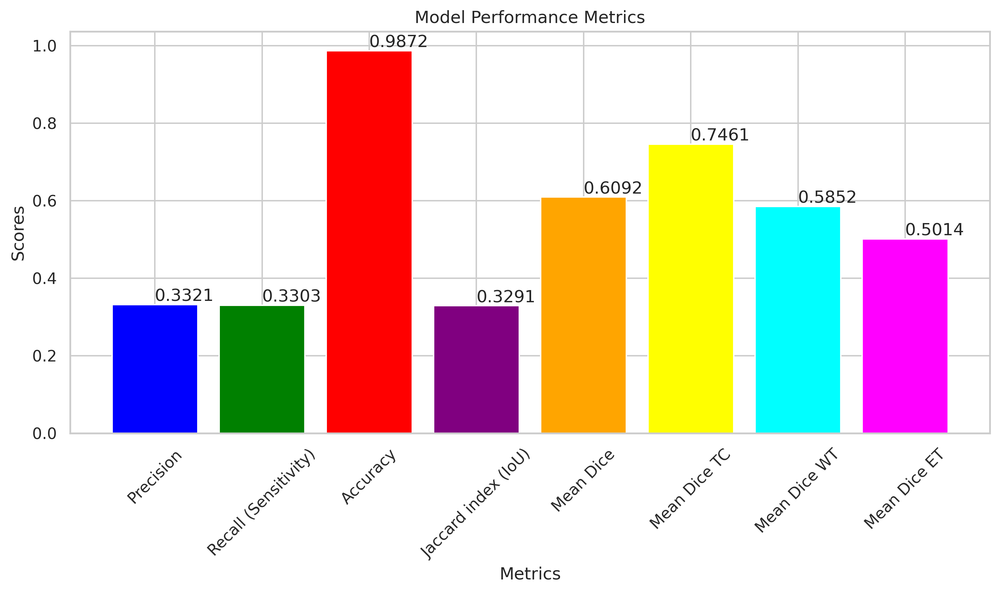

In [ ]:
import matplotlib.pyplot as plt

metrics = ["Precision", "Recall (Sensitivity)", "Accuracy", "Jaccard index (IoU)", "Mean Dice", "Mean Dice TC", "Mean Dice WT", "Mean Dice ET"]
scores = [precision, recall, accuracy, jaccard, metric, metric_tc, metric_wt, metric_et]

plt.figure(figsize=(10, 6))
bars = plt.bar(metrics, scores, color=['blue', 'green', 'red', 'purple', 'orange', 'yellow', 'cyan', 'magenta'])

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2.0, yval, f'{yval:.4f}', va='bottom')  # va: vertical alignment

plt.title('Model Performance Metrics')
plt.xlabel('Metrics')
plt.ylabel('Scores')


plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

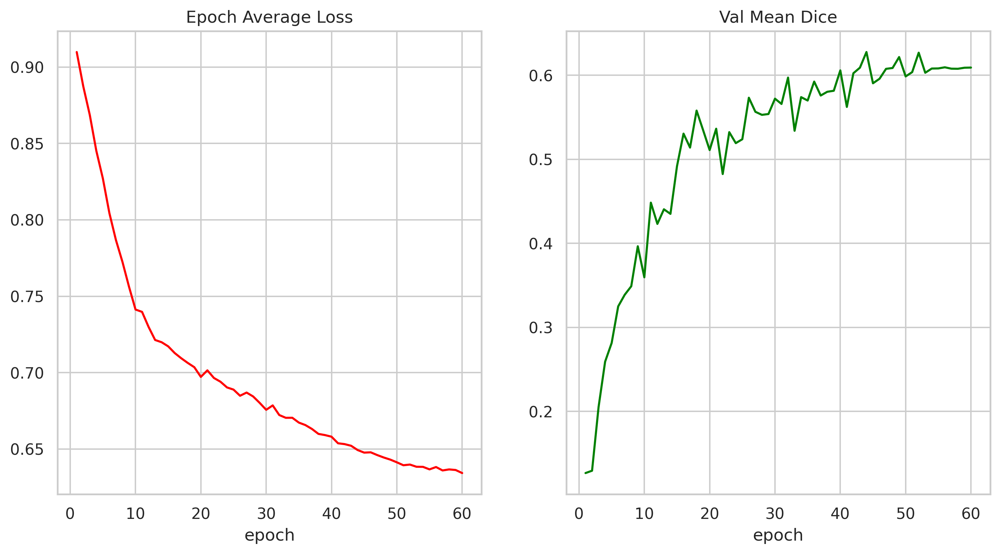

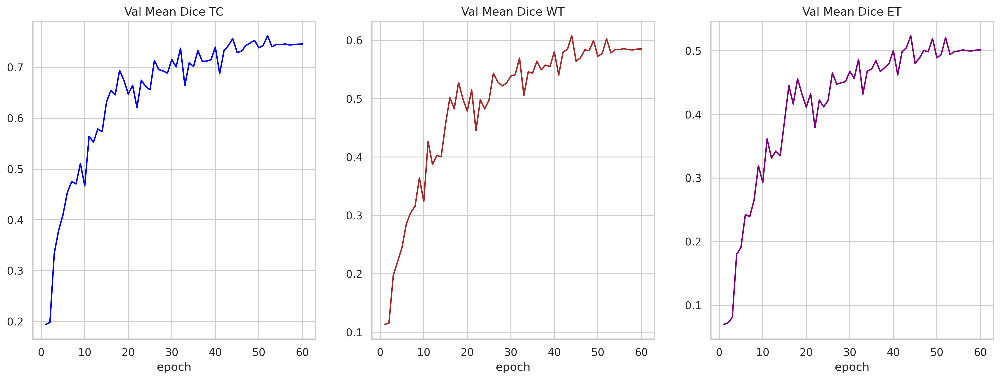

In [ ]:
plt.figure("train", (12, 6))
plt.subplot(1, 2, 1)
plt.title("Epoch Average Loss")
x = [i + 1 for i in range(len(epoch_loss_values))]
y = epoch_loss_values
plt.xlabel("epoch")
plt.plot(x, y, color="red")
plt.subplot(1, 2, 2)
plt.title("Val Mean Dice")
x = [val_interval * (i + 1) for i in range(len(metric_values))]
y = metric_values
plt.xlabel("epoch")
plt.plot(x, y, color="green")
plt.show()

plt.figure("train", (18, 6))
plt.subplot(1, 3, 1)
plt.title("Val Mean Dice TC")
x = [val_interval * (i + 1) for i in range(len(metric_values_tc))]
y = metric_values_tc
plt.xlabel("epoch")
plt.plot(x, y, color="blue")
plt.subplot(1, 3, 2)
plt.title("Val Mean Dice WT")
x = [val_interval * (i + 1) for i in range(len(metric_values_wt))]
y = metric_values_wt
plt.xlabel("epoch")
plt.plot(x, y, color="brown")
plt.subplot(1, 3, 3)
plt.title("Val Mean Dice ET")
x = [val_interval * (i + 1) for i in range(len(metric_values_et))]
y = metric_values_et
plt.xlabel("epoch")
plt.plot(x, y, color="purple")
plt.show()